# <EDA를 통한 변수 생성>
   - 태양계에 대한 자세한 정보를 알지 못하기에 주어진 변수들에 가능한 모든 조합을 적용하여 변수를 생성
   - SDSS 홈페이지 내의 정보를 활용하여 파생변수 생성
   - Polynomial Features를 사용해 변수를 생성하여도 보고 필요하다 생각하는 부분만 사용하여 조합을 해보았을 때 Polynomial Features로 만든 변수들은 너무 많음과 동시에 추후 알고리즘에 적합할 때 메모리 에러가 떴다.
   - 원 변수들의 EDA와 상관관계, Random Forest, Light GBM의 feature importance를 바탕으로 중요하다고 생각하는 변수 및 연관성이 큰 변수들을 기준으로 조합 생성
   - 생성한 300개가 넘는 변수들에 대해 모두 변환을 주기에는 시간적으로 한계가 있기에 permutation importance를 기준으로 상위 1~100개의 변수들만 변형
   - permutation importance로 365개의 변수를 100여개의 변수로 줄인 뒤 변환을 통해 만든 변수를 추가
   - 새로운 feature로 인한 성능 확인을 위해 light GBM에 적합

## <라이브러리>

In [3]:
from matplotlib import pyplot as plt
from matplotlib import rcParams
import numpy as np
import pandas as pd
import seaborn as sns
import math
import warnings
from tqdm import tqdm
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split, StratifiedKFold
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score
from sklearn.metrics import roc_auc_score
import itertools

from sklearn.ensemble import RandomForestClassifier
import lightgbm as lgbm
from lightgbm import LGBMClassifier

warnings.filterwarnings('ignore')
plt.style.use('classic')
pd.set_option('max_columns', 100)
pd.set_option("display.precision", 4)

## <데이터 불러오기>

In [4]:
trn = pd.read_csv('data/train.csv', index_col=0)
tst = pd.read_csv('data/test.csv', index_col=0)

all_fea=['u','g','r','i','z','redshift','dered_u','dered_g','dered_r','dered_i','dered_z','nObserve','nDetect','airmass_u','airmass_g','airmass_r','airmass_i','airmass_z']
fea=['u', 'g', 'r', 'i', 'z', 'redshift', 'dered_u', 'dered_g','dered_r', 'dered_i', 'dered_z']
fea2=['u','g','r','i','z','redshift','dered_u','dered_g','dered_r','dered_i','dered_z','nObserve','nDetect']
names=['u','g','r','i','z']
names_2 = ['dered_u','dered_g','dered_r','dered_i','dered_z']

# 이상치 제거(EDA시에만)(모델링때는 안씀)
# for i in range(len(fea)):
#     trn=trn[trn[fea[i]]>np.min(tst[fea[i]], axis=0)]
#     trn=trn[trn[fea[i]]<np.max(tst[fea[i]], axis=0)]
    
# 설명변수와 반응변수 분리
trn_target = trn['class']
trn = trn.drop('class', axis=1)

#카테고리별 max, min, max-min, std, sum을 구한다.
#max-min
trn['max-min'] = trn[all_fea].max(axis=1)-trn[all_fea].min(axis=1)
trn['max-min_ugriz'] = trn[names].max(axis=1)-trn[names].min(axis=1)
trn['max-min_dered'] = trn[names_2].max(axis=1)-trn[names_2].min(axis=1)
#std
trn['std'] = trn[all_fea].std(axis=1)
trn['std_ugriz'] = trn[names].std(axis=1)
trn['std_dered'] = trn[names_2].std(axis=1)
#파장별 합
trn['sum'] = trn[all_fea].sum(axis=1)
trn['sum_ugriz'] = trn[names].sum(axis=1)
trn['sum_dered'] = trn[names_2].sum(axis=1)
#파장별 최대값
trn['max'] = trn[all_fea].max(axis=1)
trn['max_ugriz'] = trn[names].max(axis=1)
trn['max_dered'] = trn[names_2].max(axis=1)
#파장별 최소값
trn['min'] = trn[all_fea].min(axis=1)
trn['min_ugriz'] = trn[names].min(axis=1)
trn['min_dered'] = trn[names_2].min(axis=1)
#파장별 max-max,min=min,sum-sum
trn['max-max']=trn[names].max(axis=1)-trn[names_2].max(axis=1)
trn['min-min']=trn[names].min(axis=1)-trn[names_2].min(axis=1)
trn['sum-sum']=trn[names].sum(axis=1)-trn[names_2].sum(axis=1)


#조합으로 연산 피쳐 생성
for c1,c2 in tqdm(itertools.combinations(fea2,2)):
    dif_col=f'diff_{c1}_{c2}'
    div_col=f'div_{c1}_{c2}'
    sum_col=f'sum_{c1}_{c2}'
    mul_col=f'mul_{c1}_{c2}'
    trn[dif_col]=trn[c1]-trn[c2]
    trn[div_col]=trn[c1]/trn[c2]
    trn[sum_col]=trn[c1]+trn[c2]
    trn[mul_col]=trn[c1]*trn[c2]


# 소수점 4자리 까지만 나타내는 asinh 변수 생성
trn['asinh_mu'] = -2.5/np.log(10)*(np.arcsinh(trn.u/24.63/(2.8e-10))-22.689378693319245)
trn['asinh_mg'] = -2.5/np.log(10)*(np.arcsinh(trn.g/25.11/(1.8e-10))-23.131211445598282)
trn['asinh_mr'] = -2.5/np.log(10)*(np.arcsinh(trn.r/24.80/(2.4e-10))-22.843529373146502)
trn['asinh_mi'] = -2.5/np.log(10)*(np.arcsinh(trn.i/24.36/(3.6e-10))-22.43806426503834)
trn['asinh_mz'] = -2.5/np.log(10)*(np.arcsinh(trn.z/22.83/(1.48e-09))-21.024370929730330)


trn['redshift%14'] = trn['redshift']%14
trn['log_redshift']=np.log1p(trn['redshift'])
trn['log_redshift']=trn['log_redshift'].fillna(0)

#도메인에서 얻은 파생변수 생성
#출처: https://www.sdss.org/dr16/algorithms/segue_target_selection/#Legacy
trn['l-color'] = (-0.436*trn['u']) + (1.129*trn['g']) - (0.119*trn['r']) - (0.574*trn['i']) + (0.1984)
trn['s-color'] = (-0.249*trn['u']) + (0.794*trn['g']) - (0.555*trn['r']) + (0.234)
trn['P1'] = (0.91*(trn['u']-trn['g'])) + (0.415*(trn['g']-trn['r'])) - (1.280)


trn['class'] = trn_target

78it [00:06, 11.79it/s]


In [5]:
#카테고리별 max, min, max-min, std, sum을 구한다.
#max-min
tst['max-min'] = tst[all_fea].max(axis=1)-tst[all_fea].min(axis=1)
tst['max-min_ugriz'] = tst[names].max(axis=1)-tst[names].min(axis=1)
tst['max-min_dered'] = tst[names_2].max(axis=1)-tst[names_2].min(axis=1)
#std
tst['std'] = tst[all_fea].std(axis=1)
tst['std_ugriz'] = tst[names].std(axis=1)
tst['std_dered'] = tst[names_2].std(axis=1)
#파장별 합
tst['sum'] = tst[all_fea].sum(axis=1)
tst['sum_ugriz'] = tst[names].sum(axis=1)
tst['sum_dered'] = tst[names_2].sum(axis=1)
#파장별 최대값
tst['max'] = tst[all_fea].max(axis=1)
tst['max_ugriz'] = tst[names].max(axis=1)
tst['max_dered'] = tst[names_2].max(axis=1)
#파장별 최소값
tst['min'] = tst[all_fea].min(axis=1)
tst['min_ugriz'] = tst[names].min(axis=1)
tst['min_dered'] = tst[names_2].min(axis=1)
#파장별 max-max,min=min,sum-sum
tst['max-max']=tst[names].max(axis=1)-tst[names_2].max(axis=1)
tst['min-min']=tst[names].min(axis=1)-tst[names_2].min(axis=1)
tst['sum-sum']=tst[names].sum(axis=1)-tst[names_2].sum(axis=1)


#조합으로 연산 피쳐 생성
for c1,c2 in tqdm(itertools.combinations(fea2,2)):
    dif_col=f'diff_{c1}_{c2}'
    div_col=f'div_{c1}_{c2}'
    sum_col=f'sum_{c1}_{c2}'
    mul_col=f'mul_{c1}_{c2}'
    tst[dif_col]=tst[c1]-tst[c2]
    tst[div_col]=tst[c1]/tst[c2]
    tst[sum_col]=tst[c1]+tst[c2]
    tst[mul_col]=tst[c1]*tst[c2]


# 소수점 4자리 까지만 나타내는 asinh 변수 생성
tst['asinh_mu'] = -2.5/np.log(10)*(np.arcsinh(tst.u/24.63/(2.8e-10))-22.689378693319245)
tst['asinh_mg'] = -2.5/np.log(10)*(np.arcsinh(tst.g/25.11/(1.8e-10))-23.131211445598282)
tst['asinh_mr'] = -2.5/np.log(10)*(np.arcsinh(tst.r/24.80/(2.4e-10))-22.843529373146502)
tst['asinh_mi'] = -2.5/np.log(10)*(np.arcsinh(tst.i/24.36/(3.6e-10))-22.43806426503834)
tst['asinh_mz'] = -2.5/np.log(10)*(np.arcsinh(tst.z/22.83/(1.48e-09))-21.024370929730330)


tst['redshift%14'] = tst['redshift']%14
tst['log_redshift']=np.log1p(tst['redshift'])
tst['log_redshift']=tst['log_redshift'].fillna(0)

#도메인에서 얻은 파생변수 생성
#출처: https://www.sdss.org/dr16/algorithms/segue_target_selection/#Legacy
tst['l-color'] = (-0.436*tst['u']) + (1.129*tst['g']) - (0.119*tst['r']) - (0.574*tst['i']) + (0.1984)
tst['s-color'] = (-0.249*tst['u']) + (0.794*tst['g']) - (0.555*tst['r']) + (0.234)
tst['P1'] = (0.91*(tst['u']-tst['g'])) + (0.415*(tst['g']-tst['r'])) - (1.280)

78it [00:00, 92.88it/s] 


In [6]:
from scipy.stats import skew, kurtosis
airmass=['airmass_u','airmass_g','airmass_r','airmass_i','airmass_z']
trn['skew']=skew(trn[names],axis=1)
trn['kurtosis']=kurtosis(trn[names],axis=1)
trn['dered_skew']=skew(trn[names_2],axis=1)
trn['dered_kurtosis']=kurtosis(trn[names_2],axis=1)
trn['airmass_skew']=skew(trn[airmass],axis=1)
trn['airmass_kurtosis']=kurtosis(trn[airmass],axis=1)

In [7]:
from scipy.stats import skew, kurtosis
airmass=['airmass_u','airmass_g','airmass_r','airmass_i','airmass_z']
tst['skew']=skew(tst[names],axis=1)
tst['kurtosis']=kurtosis(tst[names],axis=1)
tst['dered_skew']=skew(tst[names_2],axis=1)
tst['dered_kurtosis']=kurtosis(tst[names_2],axis=1)
tst['airmass_skew']=skew(tst[airmass],axis=1)
tst['airmass_kurtosis']=kurtosis(tst[airmass],axis=1)

## <커널 그래프 함수 작성>
    - 변수마다 각 클래스별로 그래프를 작성
    - 변수내에 클래스별 분포 및 특징을 확인

In [8]:
def kdeplot(feature):
    plt.figure(figsize=(12, 5))
    sns.kdeplot(trn[trn['class'] == 0][feature], color= 'green', label= 'class = 0')
    sns.kdeplot(trn[trn['class'] == 1][feature], color= 'red', label= 'class = 1')
    sns.kdeplot(trn[trn['class'] == 2][feature], color= 'blue', label= 'class = 2')
    plt.title('{}'.format(feature))

## <distplot 그래프>
    - 변환한 변수까지 총 300개가 넘는 변수들 중에서 커널 그래프로 분류가 잘 되는 변수 확인
    - 해당 변수의 변형을 극대화하여 제2의 파생변수 생성
    - 새로 만든 파생변수가 test데이터의 분포와 얼마나 일치하는지 확인

In [9]:
def distdist(trn_fea,tst_fea):
    plt.figure(figsize=(12, 5))
    sns.distplot(trn[trn_fea], color= 'red', label= '{}' .format(trn_fea), kde_kws = { 'bw' : 0.05 })
    sns.distplot(tst[tst_fea], color= 'blue', label= '{}' .format(tst_fea), kde_kws = { 'bw' : 0.05 })
    plt.title('{}'.format(trn_fea))

## < EDA >

In [12]:
PI30_1=['dered_z','dered_g','div_dered_g_dered_z','sum_dered_i_nDetect','mul_dered_g_dered_z','sum_z_dered_i','diff_r_redshift','sum_u_redshift','sum_dered_r_nDetect','mul_g_dered_z','sum_dered_r_dered_z','div_r_nObserve','sum_i_redshift','diff_dered_g_dered_z','sum_dered_g_dered_r','sum_r_dered_z','diff_u_redshift','mul_u_dered_z','mul_dered_g_dered_r','mul_i_dered_r','div_i_dered_g','sum_r_redshift','div_u_dered_z','mul_r_z','div_g_z','diff_u_dered_z','mul_r_dered_g','sum_redshift_dered_z','u','div_redshift_dered_u']

PI30_2=['mul_dered_g_nDetect','sum_r_nObserve','sum_i_dered_r','diff_z_nObserve','mul_nObserve_nDetect','asinh_mz','nObserve','asinh_mg','diff_g_dered_z','mul_g_dered_u','log_redshift','nDetect','mul_u_z','sum_r_nDetect','div_dered_i_nObserve','sum_i_z','sum_u_dered_r','dered_i','mul_g_dered_r','mul_z_dered_i','div_g_nDetect','diff_dered_g_nObserve','mul_r_dered_z','sum_i_nDetect','diff_z_dered_g','mul_g_z','sum_z_dered_z','mul_dered_u_nObserve','div_redshift_nObserve','dered_r']

PI30_3=["mul_g_i","sum_redshift_dered_u","sum_g_i","sum_z_dered_g","sum_i_dered_z","mul_r_dered_r","div_g_i","mul_dered_r_dered_i","g","div_dered_i_nDetect","mul_dered_r_nObserve","sum_r_i","min_dered","mul_i_dered_z","div_dered_r_nObserve","diff_dered_z_nDetect","div_i_nDetect","sum_nObserve_nDetect","max_dered","mul_g_r","div_z_nObserve","sum_i_dered_u","mul_dered_r_nDetect","div_dered_g_nObserve","mul_r_i","diff_i_nDetect","sum_u_r","sum_dered_g_nDetect","div_u_nDetect","sum_u_dered_g"]

PI30_4=["div_r_nDetect","mul_u_g","diff_dered_i_nDetect","mul_u_i","mul_dered_i_nObserve","div_i_dered_i","mul_i_nDetect","mul_g_dered_g","sum_u_dered_z","mul_r_dered_i","sum_g_dered_g","sum_u_g","mul_dered_u_dered_i","sum_g_nDetect","mul_z_nObserve","mul_g_nDetect","mul_dered_i_nDetect","sum_dered_g_dered_i","mul_u_dered_i","div_dered_z_nDetect","i","sum_g_z","sum_u_dered_u","sum_g_r","sum_dered","mul_u_nDetect","mul_i_dered_i","mul_dered_g_nObserve","div_dered_g_nDetect","div_u_i"]

PI30_5=["asinh_mr","div_dered_r_nDetect","mul_z_dered_r","mul_g_nObserve","diff_u_nDetect","sum_g_dered_u","sum_redshift_dered_i","div_i_nObserve","div_g_nObserve","z","mul_dered_z_nObserve","sum_dered_r_nObserve","sum_z_dered_r","sum_u_dered_i","mul_u_dered_g","mul_dered_u_dered_r","diff_z_nDetect","sum_r_dered_r","sum_dered_u_dered_g","asinh_mi","diff_i_redshift","diff_r_nObserve","mul_i_nObserve","diff_dered_r_nObserve","sum_i_dered_i","sum_r_dered_i","diff_dered_r_nDetect","sum_u_nObserve","div_dered_u_nDetect","sum_z_dered_u"]

PI30_6=["sum_dered_i_nObserve","diff_nObserve_nDetect","mul_dered_u_dered_z","div_u_nObserve","diff_u_nObserve","diff_redshift_nDetect","mul_u_nObserve","diff_dered_g_nDetect","sum_u_z","max_ugriz","sum_g_dered_r","mul_r_nObserve","div_z_nDetect","max","mul_dered_u_nDetect","sum_i_nObserve","diff_g_nDetect","sum_dered_z_nDetect","mul_z_nDetect","mul_i_z","diff_r_nDetect","diff_g_nObserve","div_g_dered_i","mul_dered_z_nDetect","mul_i_dered_u","diff_dered_u_nObserve","div_dered_z_nObserve","mul_u_r","diff_i_nObserve","sum_ugriz"]

PI30_7=["dered_u","mul_i_dered_g","mul_r_dered_u","mul_r_nDetect","sum_dered_g_nObserve","sum-sum","diff_dered_u_dered_z","diff_dered_u_nDetect","mul_dered_r_dered_z","sum_dered_u_nObserve","diff_dered_i_nObserve","diff_g_z","diff_z_redshift","diff_i_dered_g","mul_z_dered_z","min_ugriz","diff_dered_z_nObserve","mul_g_dered_i","asinh_mu","sum_dered_u_dered_r","diff_u_z","sum_u_nDetect","std_ugriz","sum_dered_r_dered_i","sum_dered_z_nObserve","mul_dered_u_dered_g","sum_r_dered_g","mul_u_dered_r","max-min_ugriz","diff_redshift_dered_r"]

PI30_8=["div_i_redshift","sum_g_redshift","div_r_dered_r","mul_z_dered_g","sum_redshift_nDetect","diff_u_dered_u","diff_i_dered_i","diff_i_dered_u","sum_g_dered_i","diff_u_dered_i","div_g_redshift","sum_u_i","div_z_dered_r","sum_i_dered_g","sum_redshift_dered_r","sum_z_nObserve","sum_dered_u_nDetect","diff_redshift_nObserve","sum_dered_u_dered_z","div_g_dered_z","sum_z_nDetect","diff_redshift_dered_z","div_dered_g_dered_i","div_dered_u_nObserve","mul_u_dered_u","sum_r_z","r","max-min_dered","mul_dered_g_dered_i","sum_g_nObserve"]


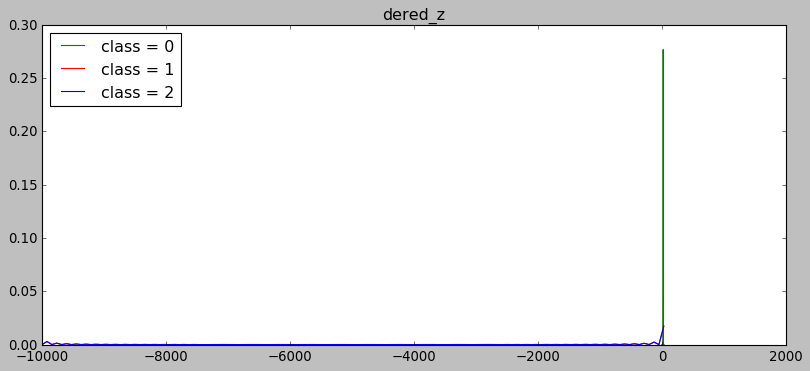

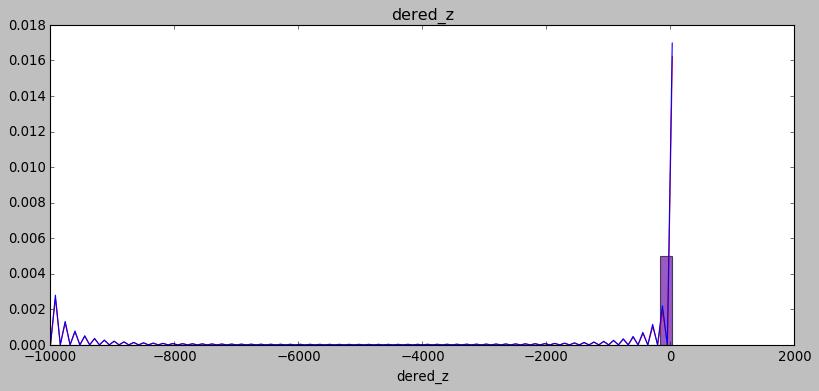

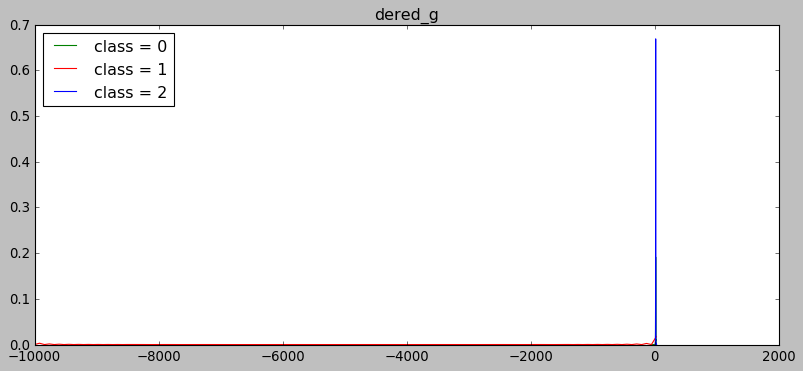

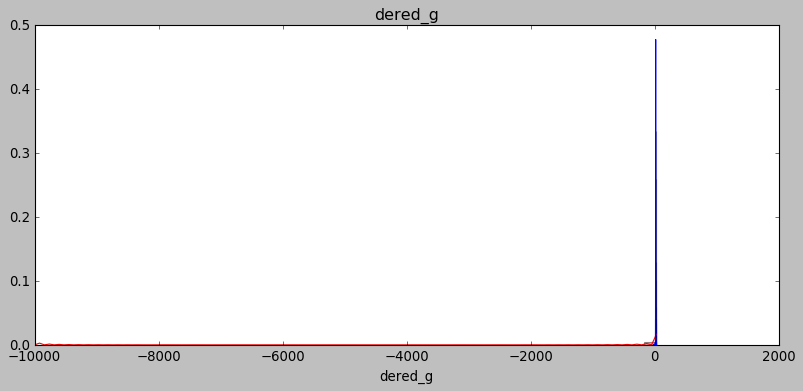

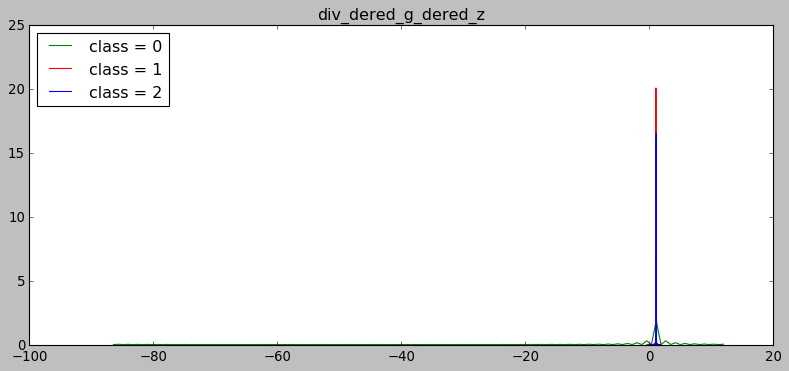

...

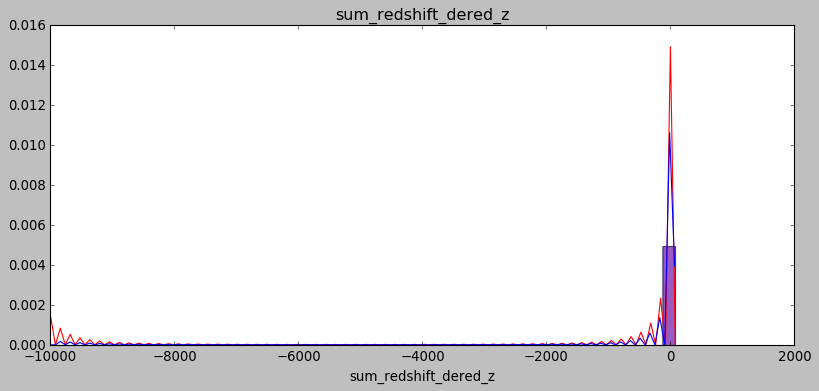

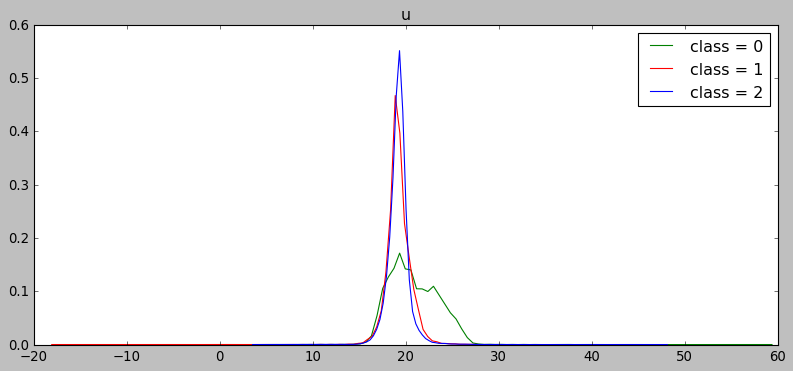

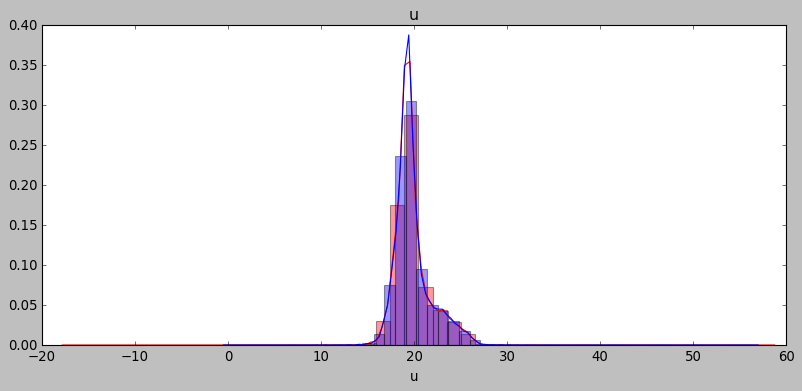

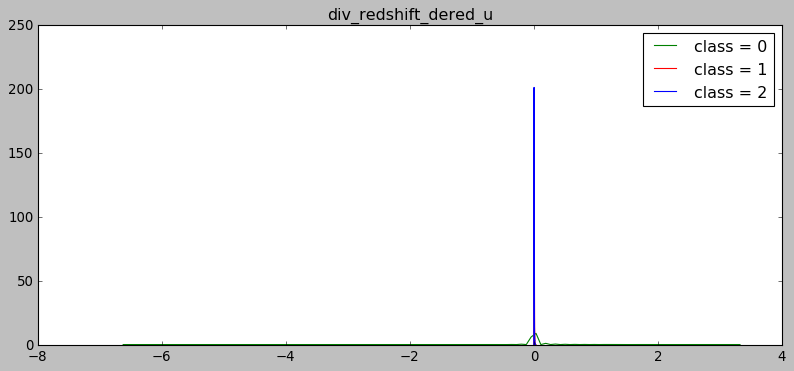

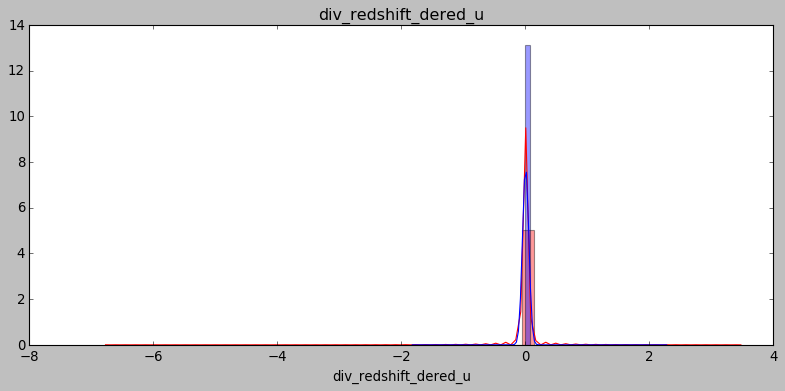

In [15]:
for i in PI30_1:
    kdeplot(i)
    distdist(i,i)
    plt.show()

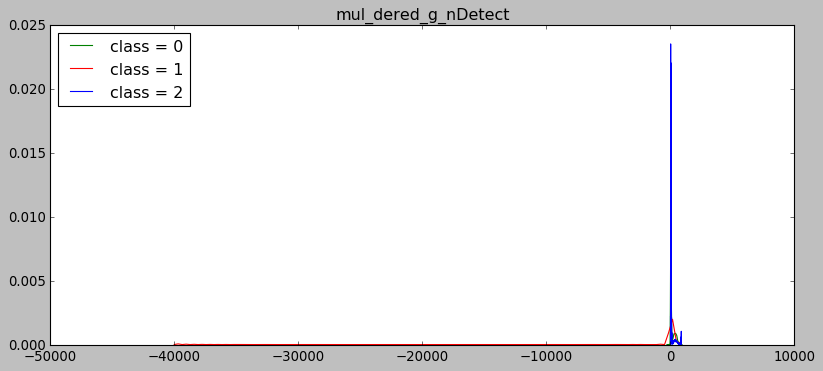

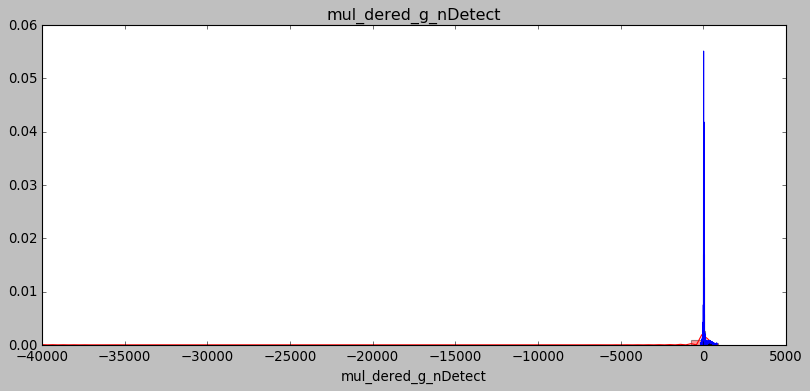

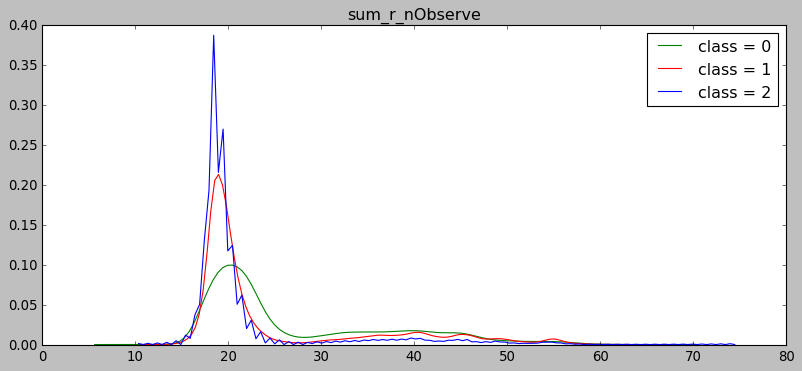

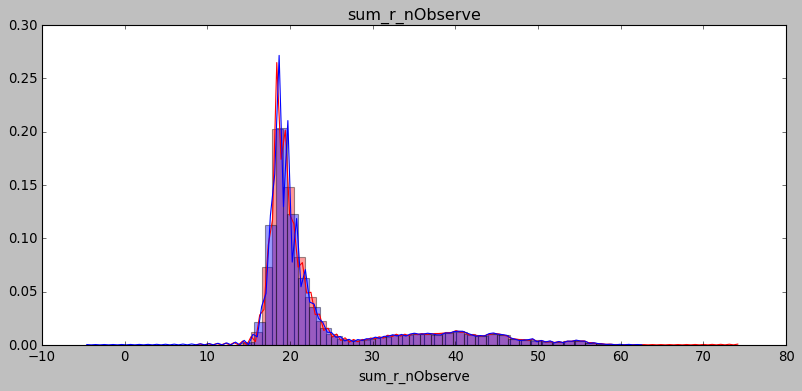

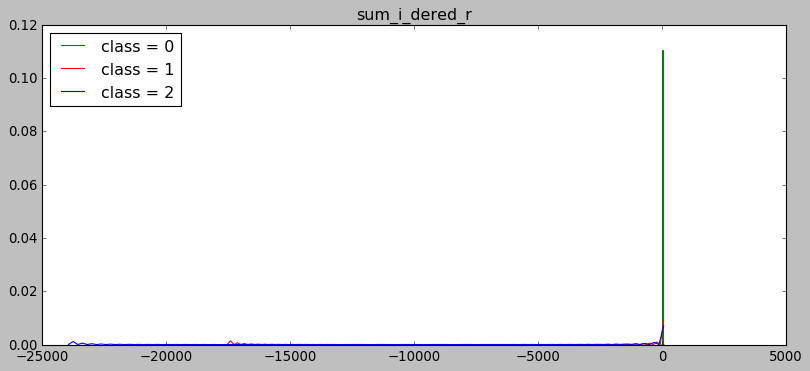

...

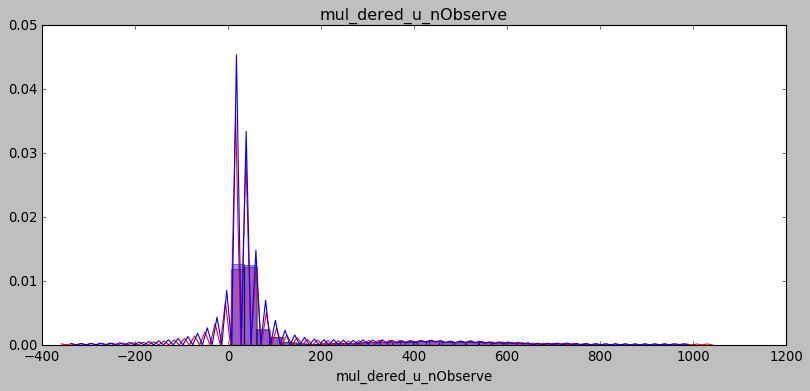

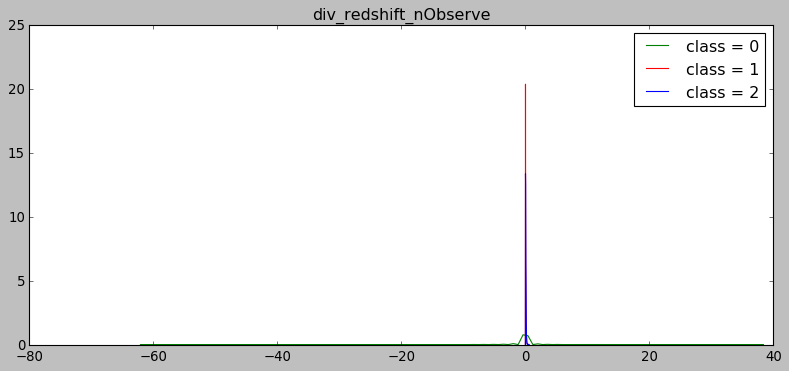

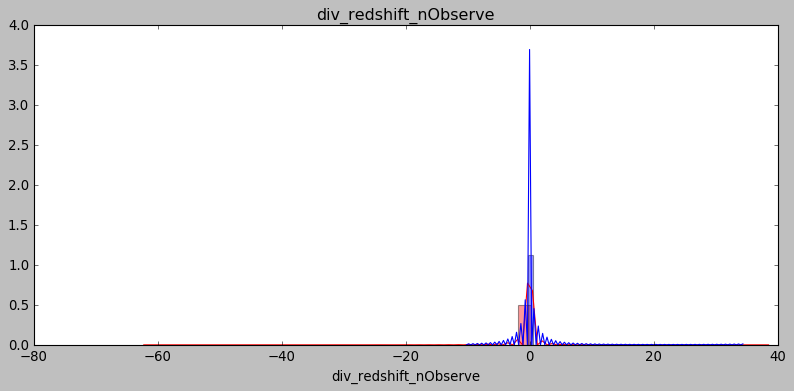

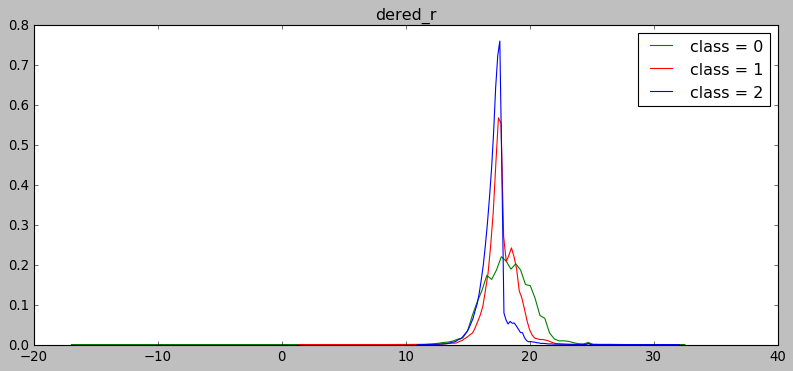

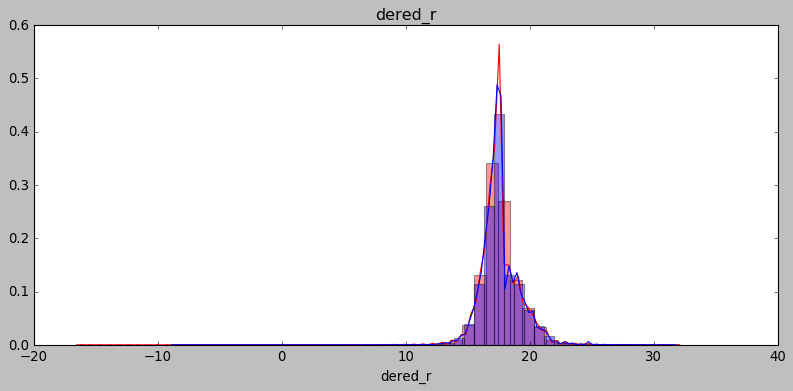

In [16]:
for i in PI30_2:
    kdeplot(i)
    distdist(i,i)
    plt.show()

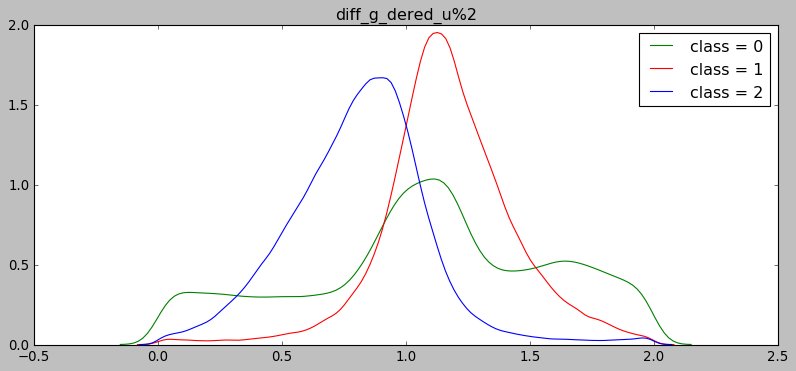

In [37]:
kdeplot('diff_g_dered_u%2')

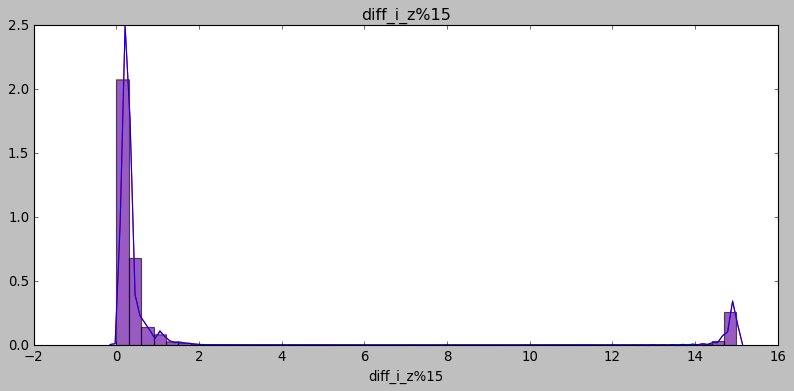

In [34]:
for i in PI30_3:
    kdeplot(i)
    distdist(i,i)
    plt.show()

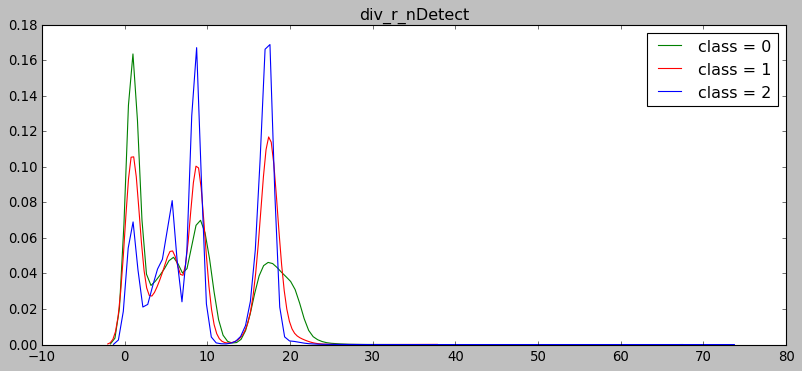

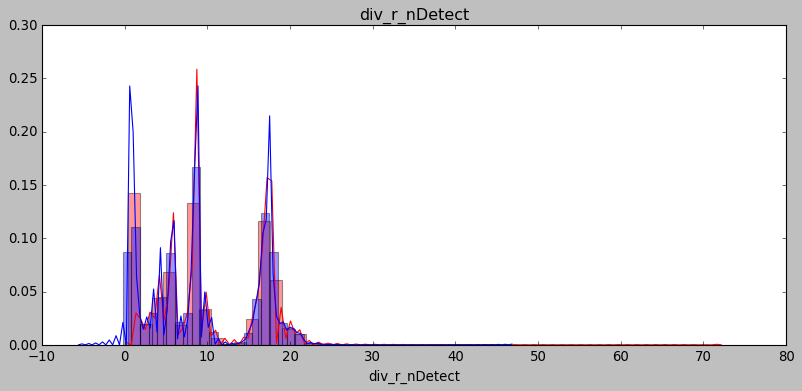

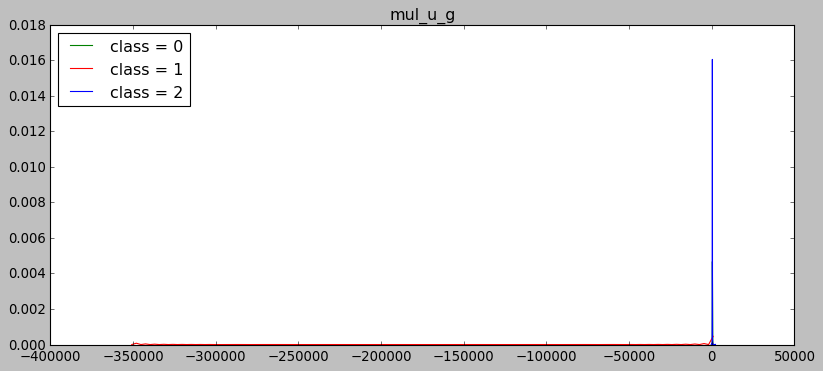

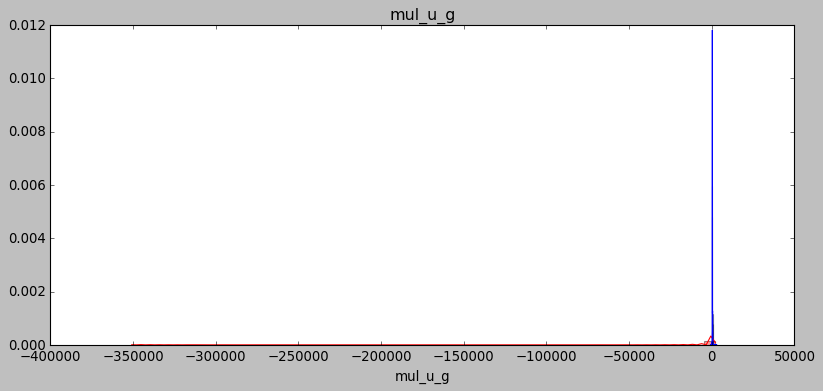

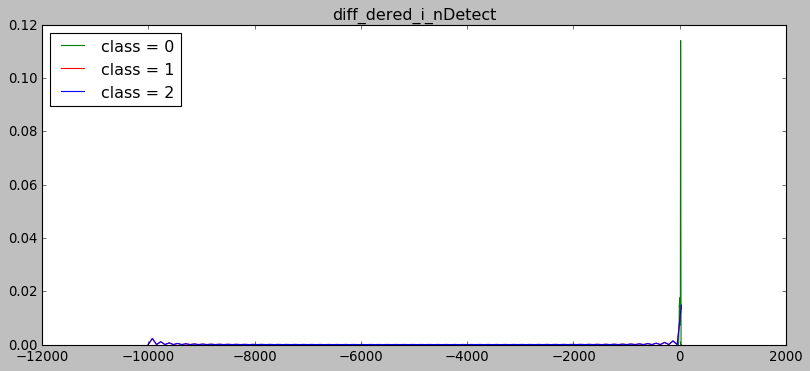

...

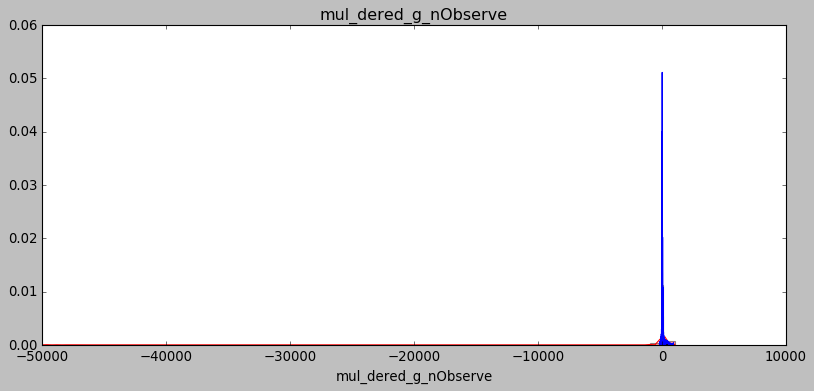

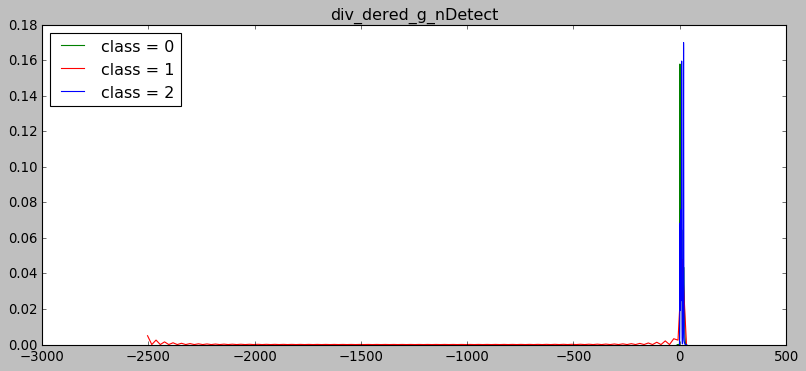

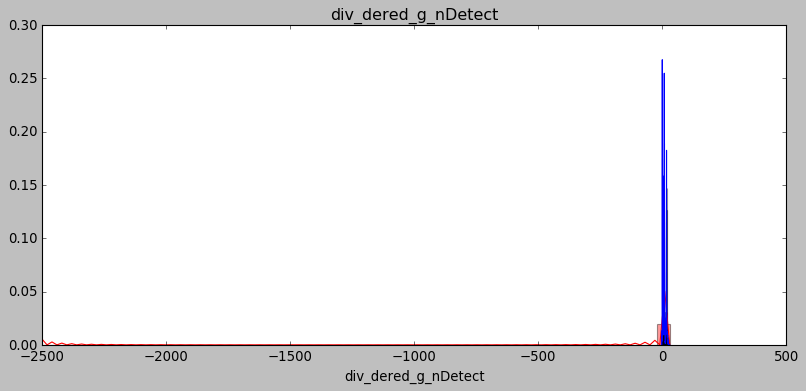

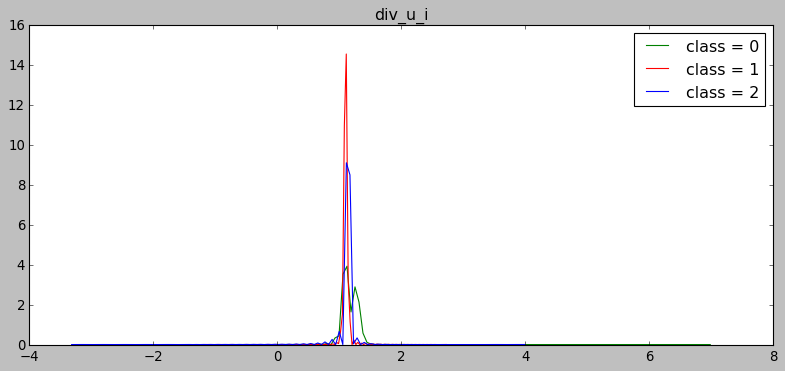

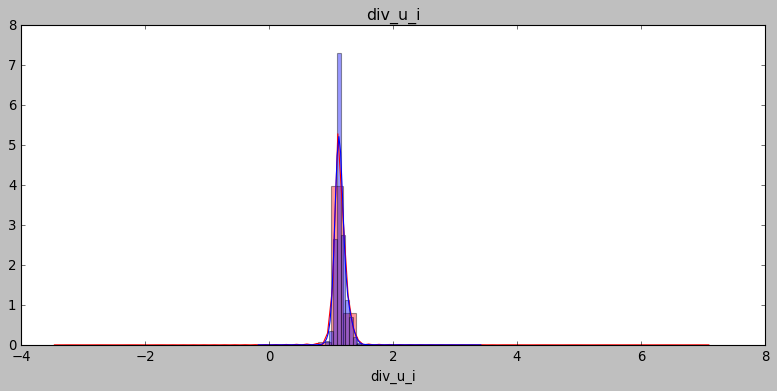

In [17]:
for i in PI30_4:
    kdeplot(i)
    distdist(i,i)
    plt.show()

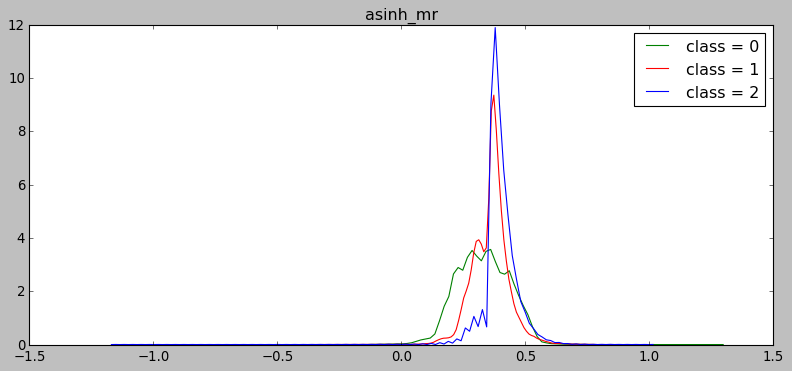

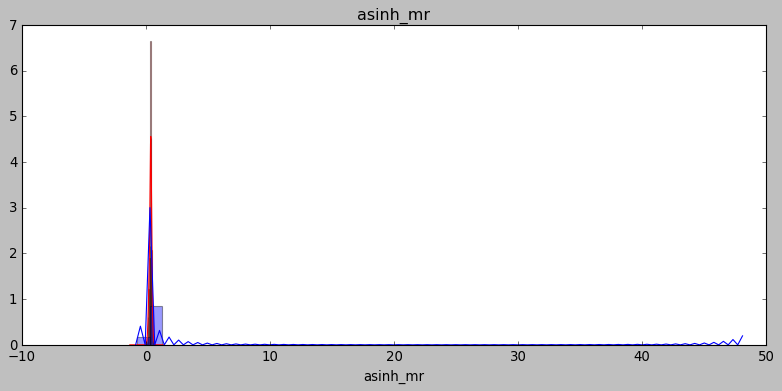

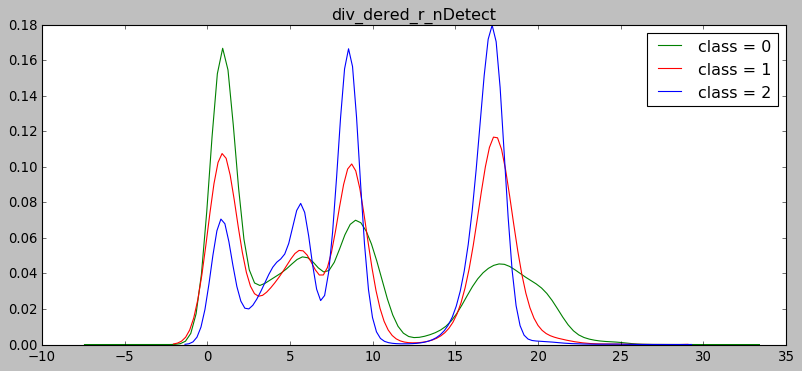

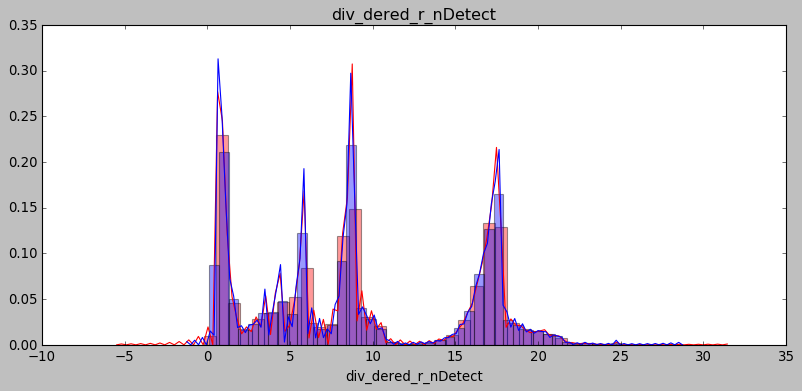

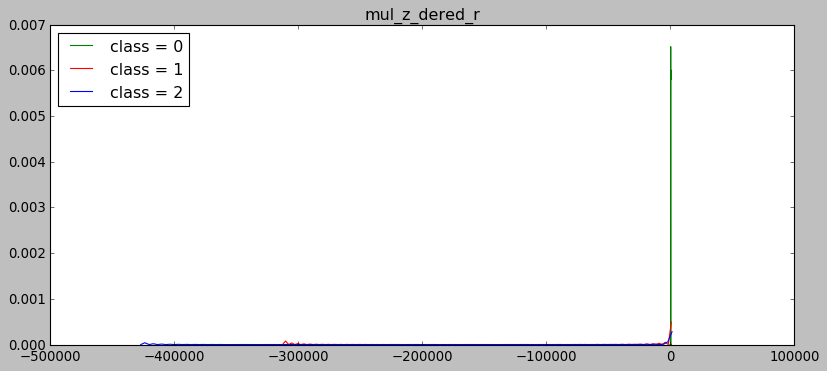

...

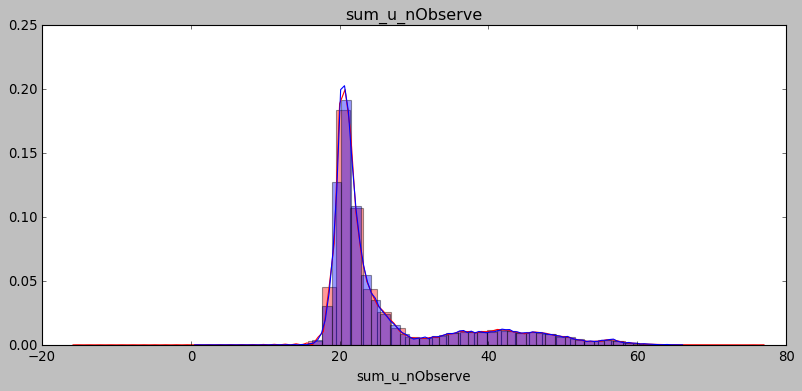

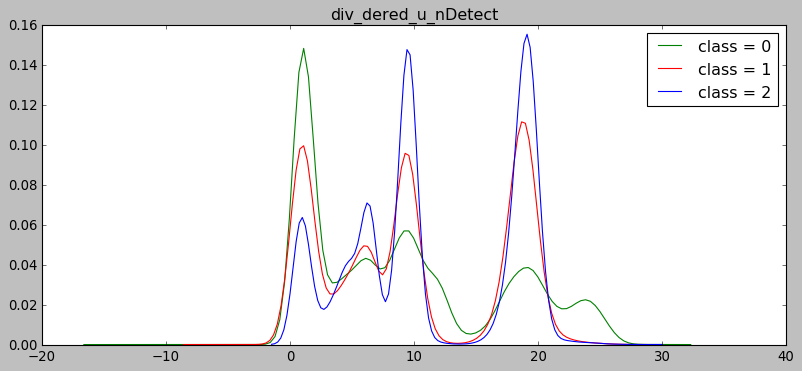

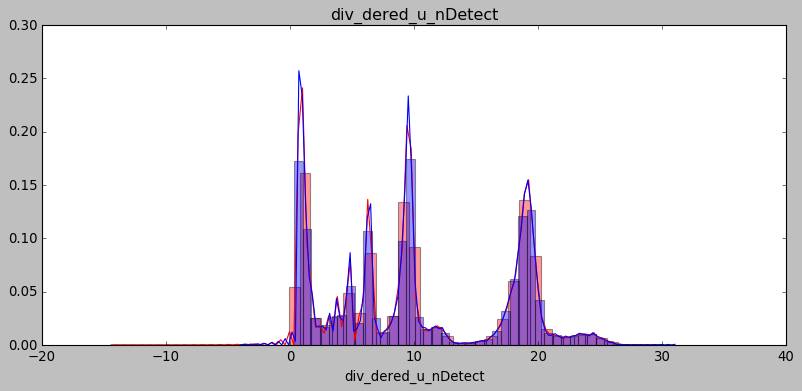

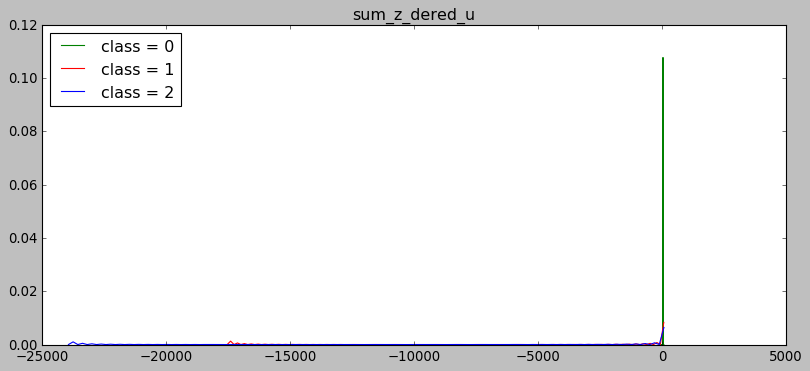

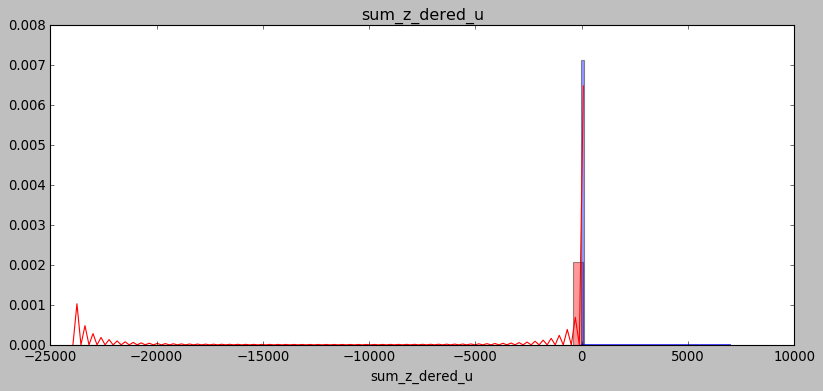

In [18]:
for i in PI30_5:
    kdeplot(i)
    distdist(i,i)
    plt.show()

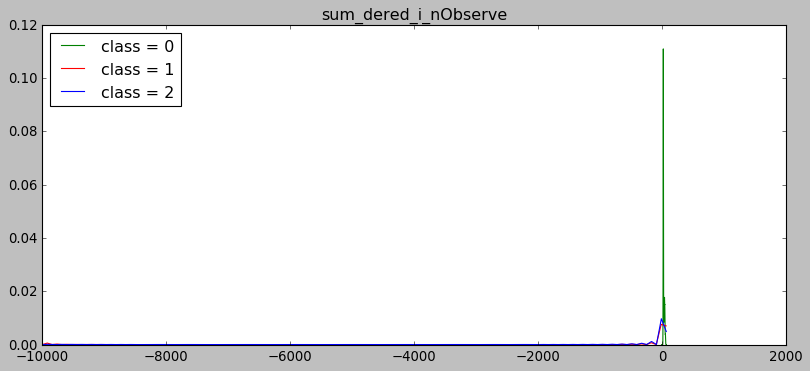

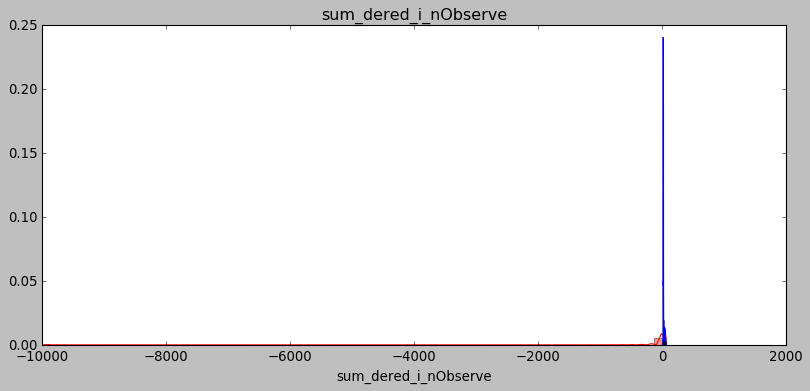

RuntimeError: Selected KDE bandwidth is 0. Cannot estiamte density.

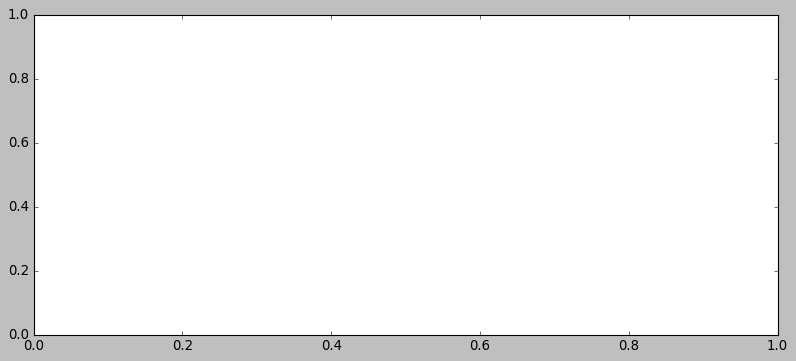

In [19]:
for i in PI30_6:
    kdeplot(i)
    distdist(i,i)
    plt.show()

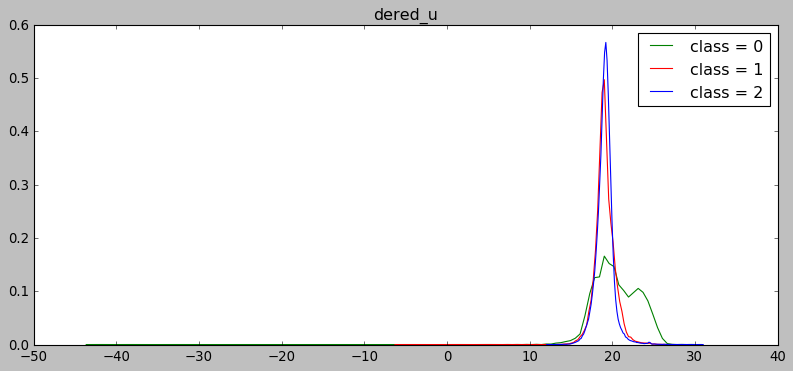

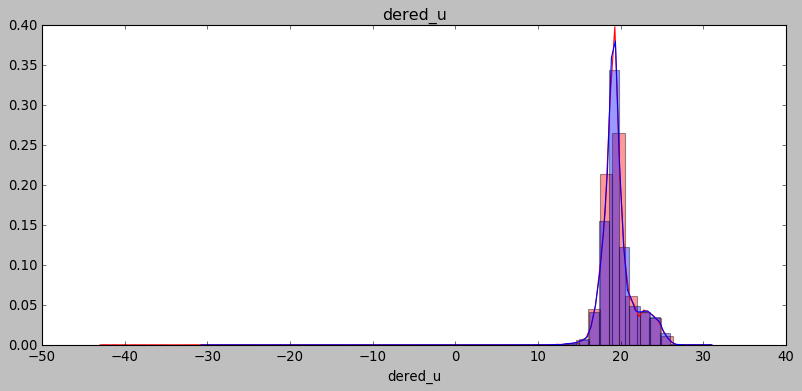

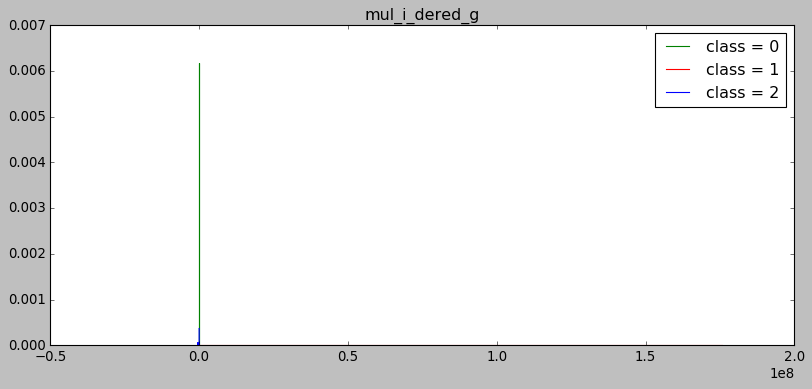

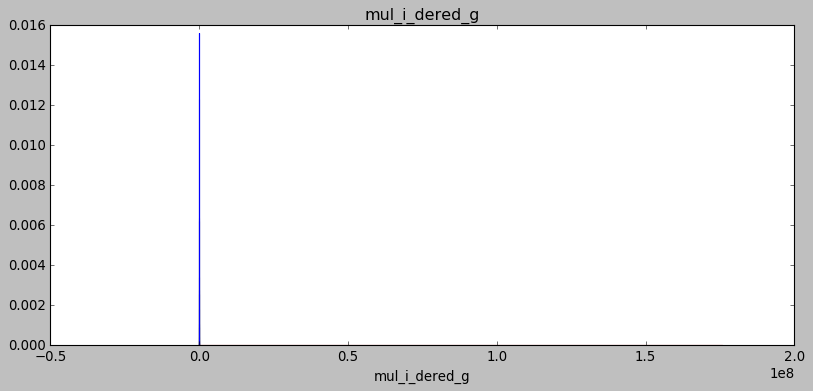

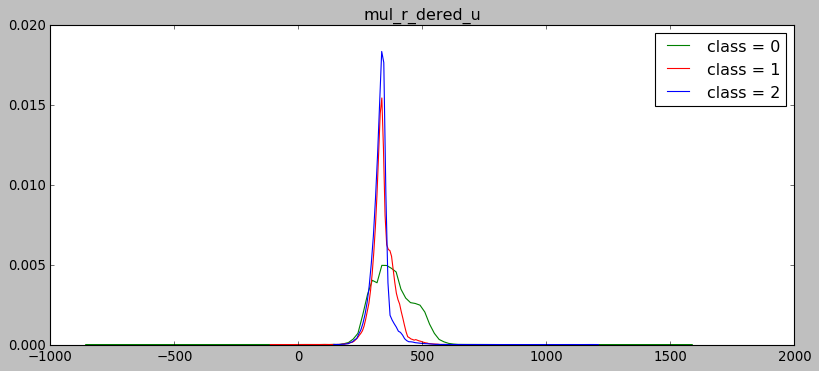

...

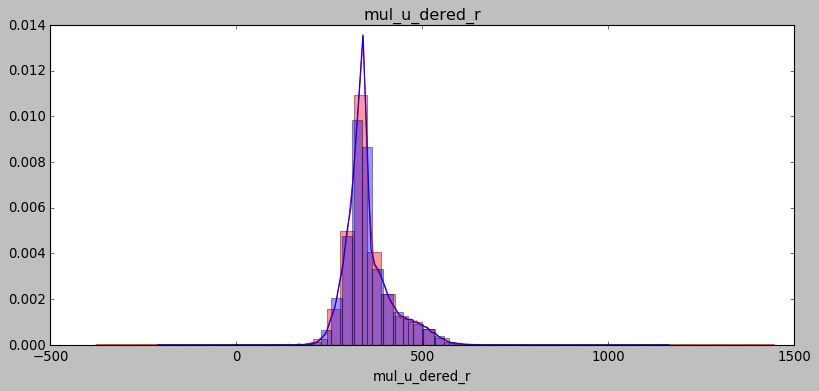

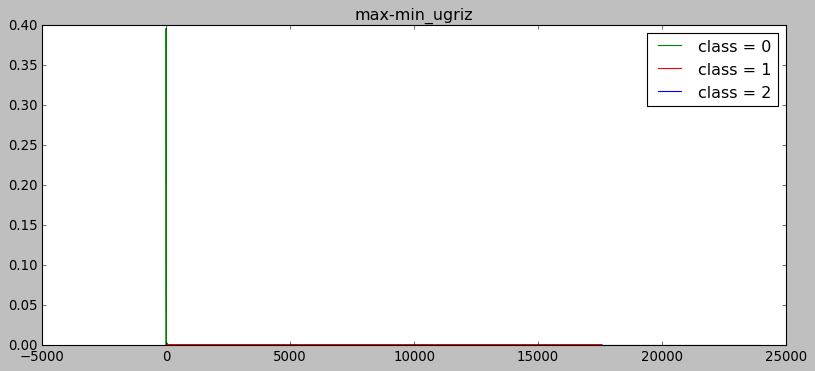

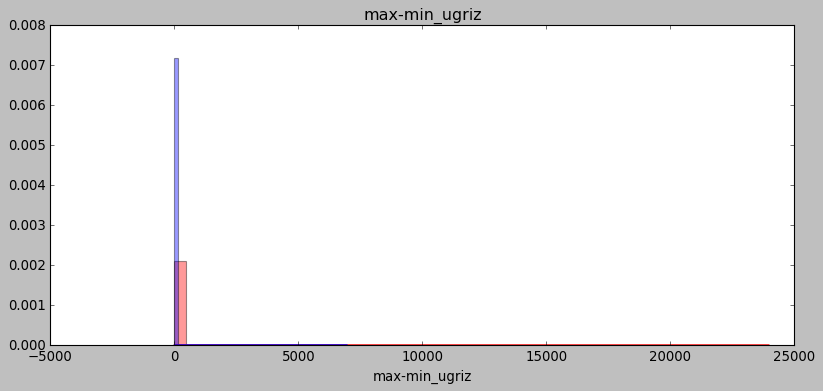

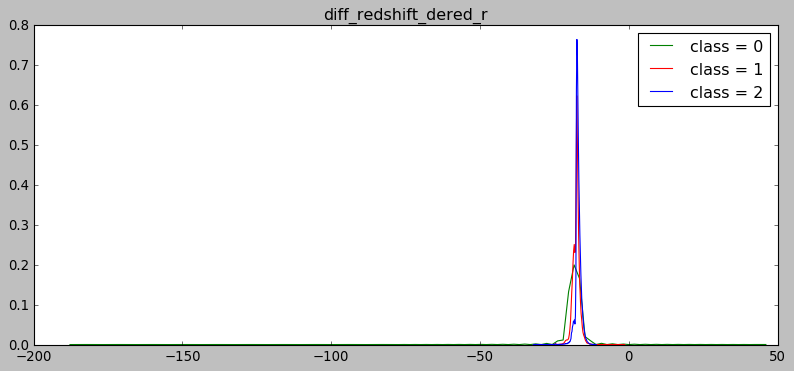

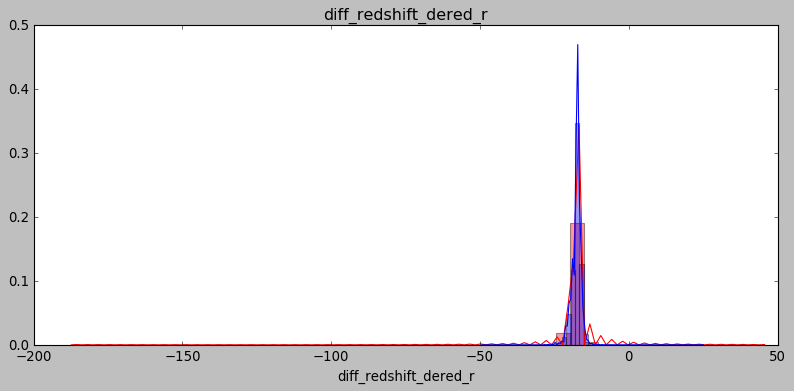

In [20]:
for i in PI30_7:
    kdeplot(i)
    distdist(i,i)
    plt.show()

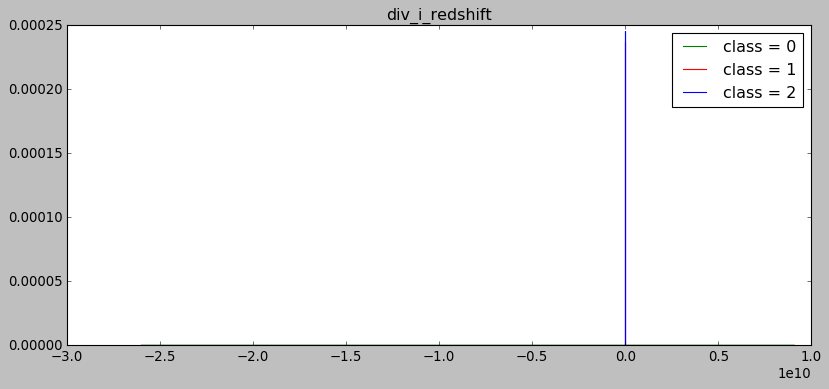

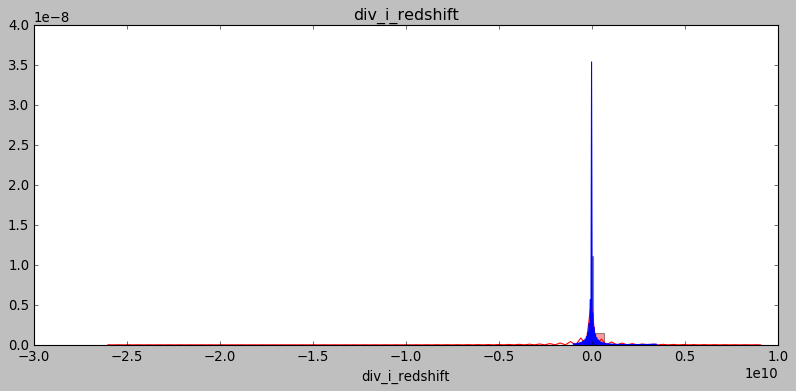

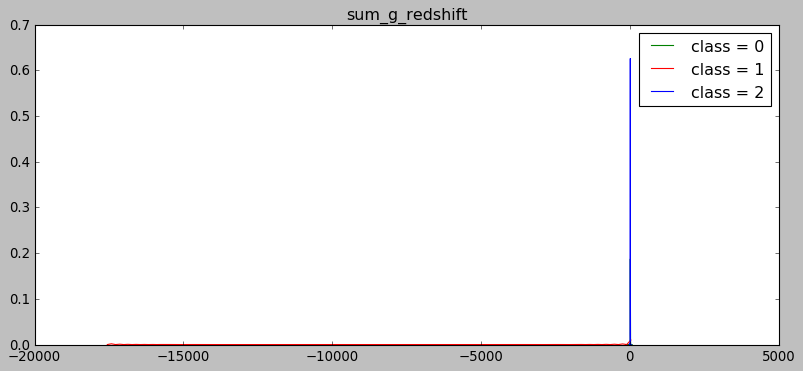

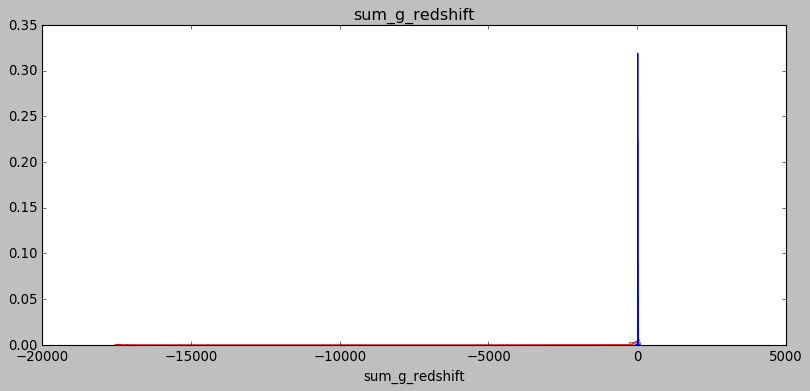

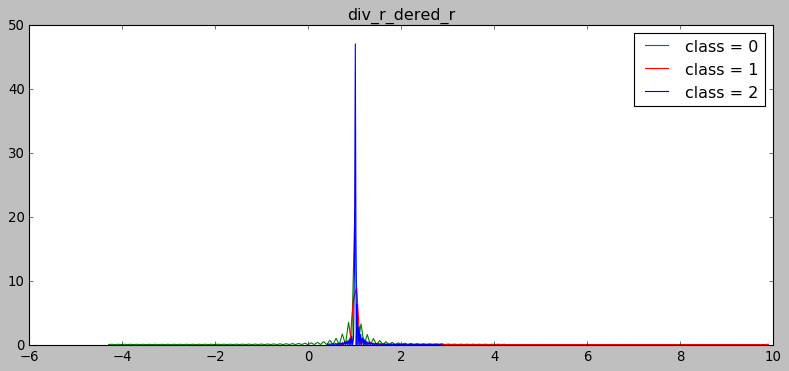

...

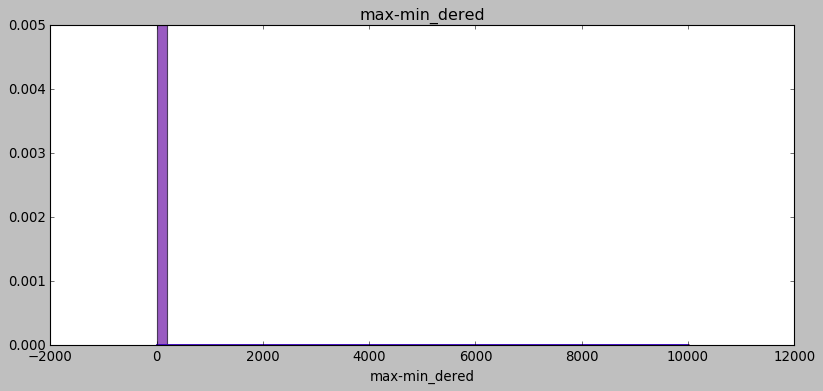

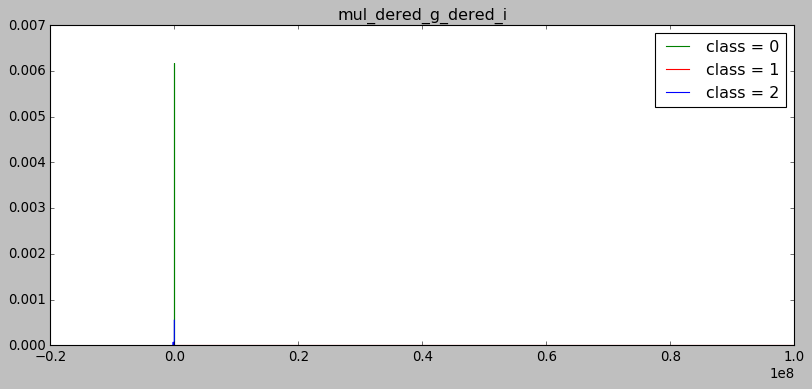

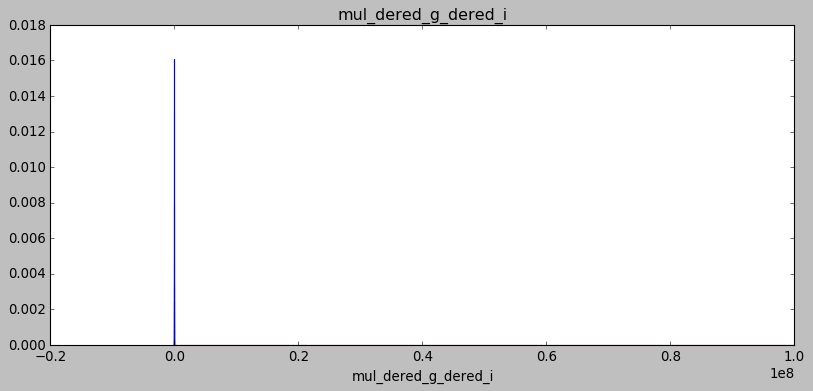

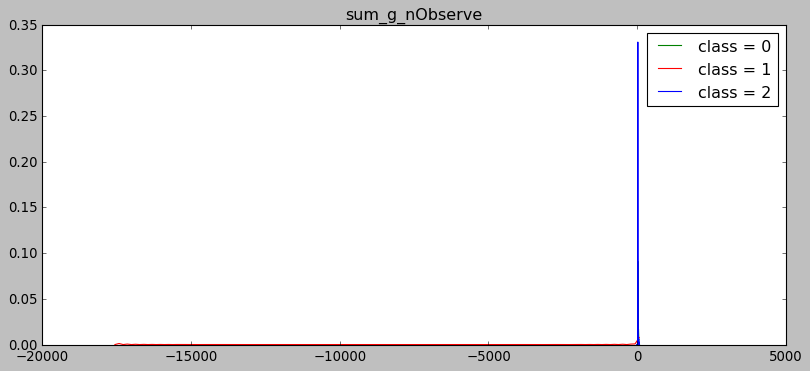

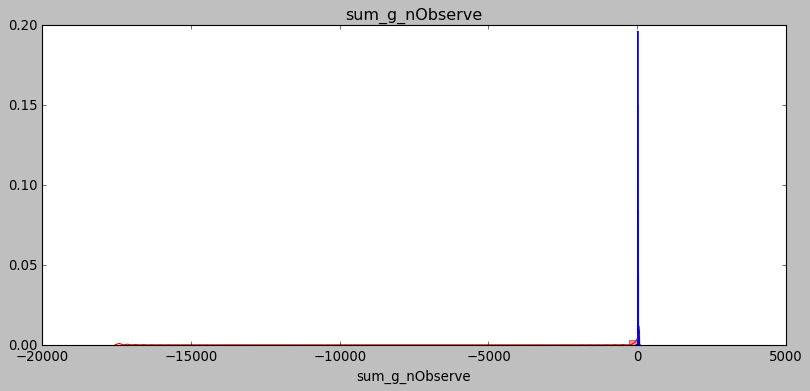

In [21]:
for i in PI30_8:
    kdeplot(i)
    distdist(i,i)
    plt.show()

## <파생변수 생성>
- 커널 그래프를 통해 분포를 확인한 뒤 변형을 통해 다음의 변수들이 유의미하게 3 클래스를 구분하는걸 확인

In [23]:
# 새로운 파생변수
trn['diff_r_dered_u%2'] = trn['diff_r_dered_u']%2
trn['diff_g_dered_u%2'] = trn['diff_g_dered_u']%2
trn['diff_u_g%3'] = trn['diff_u_g']%3
trn['diff_dered_u_dered_r%3'] = trn['diff_dered_u_dered_r']%3
trn['s-color%10'] = trn['s-color']%10
trn['diff_i_z%15'] = trn['diff_i_z']%15
                               
tst['diff_r_dered_u%2'] = tst['diff_r_dered_u']%2
tst['diff_g_dered_u%2'] = tst['diff_g_dered_u']%2
tst['diff_u_g%3'] = tst['diff_u_g']%3
tst['diff_dered_u_dered_r%3'] = tst['diff_dered_u_dered_r']%3
tst['s-color%10'] = tst['s-color']%10
tst['diff_i_z%15'] = tst['diff_i_z']%15

## <변환한 변수를 넣고 모델 학습>

In [4]:
# tst에 넣어보기
lgbm_wrapper=LGBMClassifier(
learning_rate = 0.07,
n_estimators=500,
max_depth = 30,
boosting = 'dart',
objective = 'multiclass',
num_class = 3,
metric = 'multi_error',
num_leaves = 100
        )
lgbm_wrapper

LGBMClassifier(boosting='dart', boosting_type='gbdt', class_weight=None,
               colsample_bytree=1.0, importance_type='split',
               learning_rate=0.07, max_depth=30, metric='multi_error',
               min_child_samples=20, min_child_weight=0.001, min_split_gain=0.0,
               n_estimators=500, n_jobs=-1, num_class=3, num_leaves=100,
               objective='multiclass', random_state=None, reg_alpha=0.0,
               reg_lambda=0.0, silent=True, subsample=1.0,
               subsample_for_bin=200000, subsample_freq=0)

In [5]:
print(trn.shape)
print(tst.shape)
ftr=trn.drop("class",axis=1)
target=trn['class']
evals=[(ftr,target)]

(319954, 114)
(80000, 113)


In [6]:
model_test=lgbm_wrapper.fit(ftr,target,eval_set = evals, eval_metric='multi_error',verbose=True)

[LightGBM] [Warning] boosting is set=dart, boosting_type=gbdt will be ignored. Current value: boosting=dart
[1]	training's multi_error: 0.508648
[2]	training's multi_error: 0.135732
[3]	training's multi_error: 0.135307
[4]	training's multi_error: 0.135057
[5]	training's multi_error: 0.109225
[6]	training's multi_error: 0.0909318
[7]	training's multi_error: 0.0843746
[8]	training's multi_error: 0.0879126
[9]	training's multi_error: 0.0823056
[10]	training's multi_error: 0.0786082
[11]	training's multi_error: 0.0758922
[12]	training's multi_error: 0.0771142
[13]	training's multi_error: 0.0747045
[14]	training's multi_error: 0.072898
[15]	training's multi_error: 0.0712415
[16]	training's multi_error: 0.0699851
[17]	training's multi_error: 0.0689505
[18]	training's multi_error: 0.0680879
[19]	training's multi_error: 0.0673597
[20]	training's multi_error: 0.0666533
[21]	training's multi_error: 0.0668846
[22]	training's multi_error: 0.0663095
[23]	training's multi_error: 0.0660939
[24]	train

[207]	training's multi_error: 0.0561674
[208]	training's multi_error: 0.0560893
[209]	training's multi_error: 0.0561549
[210]	training's multi_error: 0.0561706
[211]	training's multi_error: 0.0561768
[212]	training's multi_error: 0.0560487
[213]	training's multi_error: 0.0559737
[214]	training's multi_error: 0.0557799
[215]	training's multi_error: 0.0556893
[216]	training's multi_error: 0.0556986
[217]	training's multi_error: 0.0556861
[218]	training's multi_error: 0.0556267
[219]	training's multi_error: 0.0555642
[220]	training's multi_error: 0.055483
[221]	training's multi_error: 0.0554799
[222]	training's multi_error: 0.0554205
[223]	training's multi_error: 0.0553892
[224]	training's multi_error: 0.0554111
[225]	training's multi_error: 0.0554392
[226]	training's multi_error: 0.0554673
[227]	training's multi_error: 0.0555174
[228]	training's multi_error: 0.055458
[229]	training's multi_error: 0.0554767
[230]	training's multi_error: 0.0554517
[231]	training's multi_error: 0.0553611
[2

[413]	training's multi_error: 0.0482913
[414]	training's multi_error: 0.0482194
[415]	training's multi_error: 0.0481413
[416]	training's multi_error: 0.0480538
[417]	training's multi_error: 0.0481225
[418]	training's multi_error: 0.0481413
[419]	training's multi_error: 0.0481038
[420]	training's multi_error: 0.0481257
[421]	training's multi_error: 0.0480319
[422]	training's multi_error: 0.0479225
[423]	training's multi_error: 0.0479069
[424]	training's multi_error: 0.0478225
[425]	training's multi_error: 0.0478538
[426]	training's multi_error: 0.0477225
[427]	training's multi_error: 0.04766
[428]	training's multi_error: 0.047685
[429]	training's multi_error: 0.0475943
[430]	training's multi_error: 0.0475818
[431]	training's multi_error: 0.0474975
[432]	training's multi_error: 0.0474818
[433]	training's multi_error: 0.0474506
[434]	training's multi_error: 0.0474787
[435]	training's multi_error: 0.0475037
[436]	training's multi_error: 0.0474224
[437]	training's multi_error: 0.0472912
[43

In [7]:
preds_test=model_test.predict(tst)
pd.Series(preds_test).value_counts()

2    40891
0    29988
1     9121
dtype: int64

In [8]:
sub = pd.read_csv('submission.csv')
sub['class'] = preds_test.reshape(-1,1)
sub.to_csv('submission_lgbm_new_variables.csv')

성능이 조금 높아졌으나 추후 스태킹할 때나 다른 모델들에서 위의 파생변수들이 어떤 영향을 줄지 의문